## Intermediate Data Science

#### University of Redlands - DATA 201
#### Prof: Joanna Bieri [joanna_bieri@redlands.edu](mailto:joanna_bieri@redlands.edu)
#### [Class Website: data201.joannabieri.com](https://joannabieri.com/data201_intermediate.html)

In [2]:
# Some basic package imports
import os
import numpy as np
import pandas as pd

# Visualization packages
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.defaule = 'colab'
import seaborn as sns

# ML packages
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score 
from sklearn.metrics import confusion_matrix, classification_report

## Do the two You Try problems from the lecture. 

- Open the Day14_KnnLinearModels.ipynb code and run it.
- Do the two you try problems to make sure you understand the models and over vs. under fitting.


---------------
## Knn vs Linear Models - Day14 HW

We are going to do an analysis of life expectancy data:

[https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who](https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who)

Your goal is to do a full analysis of this data. You should start with a description of the data and a full Exploratory Data Analysis! 
- Do some basic statistics and value counts. Is the data balanced? Is it timeseries data? Should you analyze the years separately or all together?
- Use seaborn to plot the data and choose your features. You should consider if some features have more of a polynomial shape. Get to know the data! Discuss what parts of the data are going to be important in choosing your model.
- For the features that you choose, clean up the data: remove false zeros, remove NAN's, and if possible remove outliers. For each action that you take describe your logic, why is this a good idea?
- Choose a model: Linear Regression, KNN, Logistic Regression, Polynomial Features.

After you have picked a model you should Train and Test your model!
- Make sure to compare the model metrics for BOTH the training and the testing sets. For classification you will want to compare accuracy/precision/recall and for regression you will want to compare MSE/R^2.
- What variables seem to be the strongest predictors for life expectancy?
- What models did you try and why did you decide which was best?


Please write up your conclusions.

**Your final notebooks should:**

- [ ] Be a completely new notebook with just the Day14 stuff in it NO YOU TRY: Read in the data, make the plots. Make sure to discuss what you see and comment on why your plots are great!
- [ ] **Contain your "best model(s)" ALONG WITH a discussion of what other things you tried and why these are your best results.**
- [ ] Be reproducible with junk code removed.
- [ ] Have lots of language describing what you are doing, especially for questions you are asking or things that you find interesting about the data. Use complete sentences, nice headings, and good markdown formatting: https://www.markdownguide.org/cheat-sheet/
- [ ] It should run without errors from start to finish.

# Do some basic statistics and value counts. Is the data balanced? Is it timeseries data? Should you analyze the years separately or all together?


In [9]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kumarajarshi/life-expectancy-who")

print("Path to dataset files:", path)

file = path + '/' + os.listdir(path)[0]
df = pd.read_csv(file) 
df

/Users/sethchairez/anaconda3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



Path to dataset files: /Users/sethchairez/.cache/kagglehub/datasets/kumarajarshi/life-expectancy-who/versions/1


,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [11]:
df.keys()

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [13]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [15]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [17]:
df['Year'].unique()

array([2015, 2014, 2013, 2012, 2011, 2010, 2009, 2008, 2007, 2006, 2005,
       2004, 2003, 2002, 2001, 2000])

# Use seaborn to plot the data and choose your features. You should consider if some features have more of a polynomial shape. Get to know the data! Discuss what parts of the data are going to be important in choosing your model.


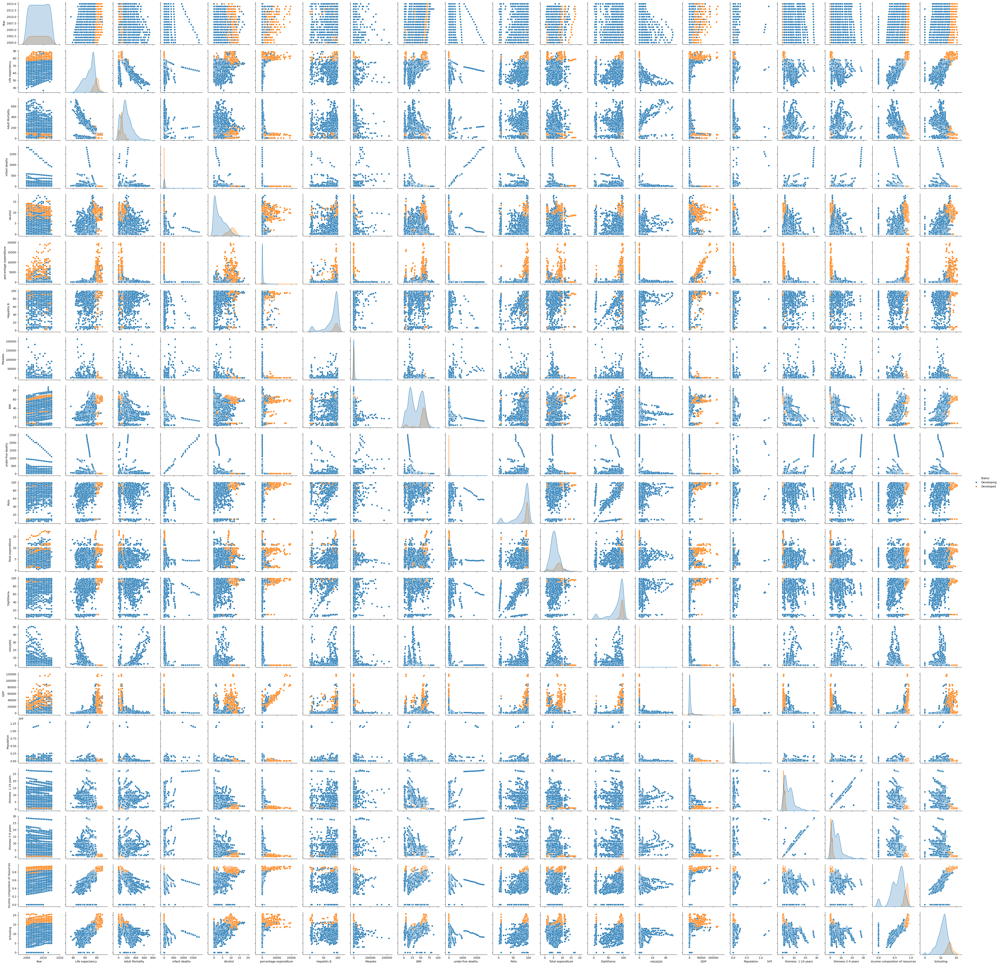

In [81]:
sns.pairplot(df, hue = 'Status')

Based on this graph, the features that are going to the most important in our decision are HIV/AIDS, Percentage expenditure, under five deaths, and Measles. We are specifically choosing these columns because these are the columns that do not have any NaN's.  

# For the features that you choose, clean up the data: remove false zeros, remove NAN's, and if possible remove outliers. For each action that you take describe your logic, why is this a good idea?


In [19]:
#Drop the naas in life expectancy
df_new = df[df['Life expectancy '].notna()]
df_new['Life expectancy '].isna().sum()

0

The reason that we removed the NaN's within the data set 

# `What variables seem to be the strongest predictors for life expectancy?


In [21]:
# We choose columns that have no nans 
#This is a decision - maybe a bad one!
X_col = ['infant deaths', 'percentage expenditure',
       'Measles ', 'under-five deaths ' , ' HIV/AIDS'] 
y_col = ['Life expectancy ']
X = df_new[X_col]
y = df_new[y_col]

We use these variables because there is a strong linear relationship shown within the pairplot. This is our best indicator compared to life expectancy. 

In [85]:
# This is the data

In [23]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2928 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2928 non-null   object 
 1   Year                             2928 non-null   int64  
 2   Status                           2928 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2928 non-null   int64  
 6   Alcohol                          2735 non-null   float64
 7   percentage expenditure           2928 non-null   float64
 8   Hepatitis B                      2375 non-null   float64
 9   Measles                          2928 non-null   int64  
 10   BMI                             2896 non-null   float64
 11  under-five deaths                2928 non-null   int64  
 12  Polio                    

There is no time series data within this data set however there are floats, ints, and strings. 

In [25]:
#Drop NaN's across the column
#What does this do? are there certain class that get dropped. 
for col in X_col: 
    print(col)
    print(sum(df[col].isna()))

infant deaths
0
percentage expenditure
0
Measles 
0
under-five deaths 
0
 HIV/AIDS
0


infant deaths


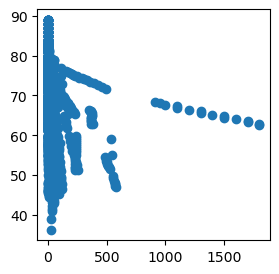

percentage expenditure


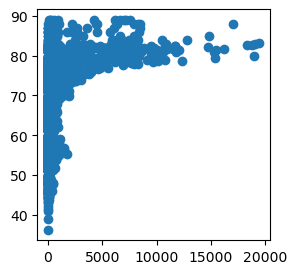

Measles 


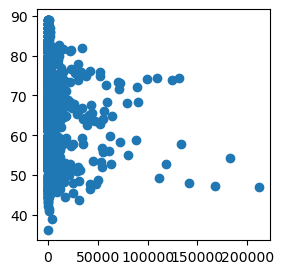

under-five deaths 


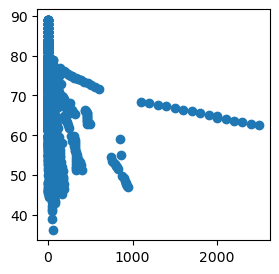

 HIV/AIDS


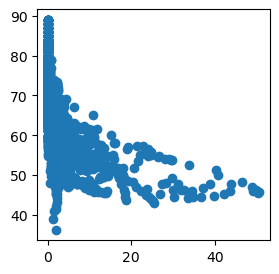

In [27]:
for col in X_col:
    print(col)
    plt.figure(figsize = (3,3))
    plt.scatter(df[col],df[y_col])
    plt.show()

Notes about these scatterplots: 
Infant deaths scatter at around 0, with a downward life expectancy. There is a line of outliers going from 650 to over 1,500.

Percentage expenditure has a heavy upward skew. Polynomial? 

Measles have many large outliters 

Under five deaths there is a strong negative linear trend

HIV there's a strong polynomial negative curve. 

In [29]:
#test train split

X_train, X_test,y_train,y_test = train_test_split(X,y, train_size = .2,random_state = 16) 

# Choose a model: Linear Regression, KNN, Logistic Regression, Polynomial Features.


In [126]:
#Create model
model = KNeighborsRegressor(n_neighbors = 3)
#model = LinearRegression()
model.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=3)

In [111]:
X_test.iloc[0]

infant deaths             10.000000
percentage expenditure    35.716138
Measles                    0.000000
under-five deaths         12.000000
 HIV/AIDS                  0.200000
Name: 2559, dtype: float64

In [113]:
y_pred = model.predict(X_test)

In [115]:
y_pred[0]

array([65.43333333])

In [103]:
y_test.iloc[0]

Life expectancy     66.7
Name: 2559, dtype: float64

# Make sure to compare the model metrics for BOTH the training and the testing sets. For classification you will want to compare accuracy/precision/recall and for regression you will want to compare MSE/R^2.


In [123]:
MSE = mean_squared_error(y_test,y_pred)
print(MSE) 

61.571338265281916


In [119]:
Rsq = r2_score(y_test,y_pred)
print(Rsq)

0.33262596577273884


In [91]:
MSEs_train = []
Rsqrd_train = []
MSEs_test  = [] 
Rsqrd_test = []


for k in [2,3,4,5,6,7,8,9,10]:
    model = KNeighborsRegressor(n_neighbors = k) 
    model.fit(X_train,y_train)

    #train
    y_pred = model.predict(X_train)
    MSEs_train.append(mean_squared_error(y_train,y_pred))
    Rsqrd_train.append(r2_score(y_train,y_pred))

    y_pred = model.predict(X_test)
    MSEs_test.append(mean_squared_error(y_test,y_pred))
    Rsqrd_test.append(r2_score(y_test,y_pred))

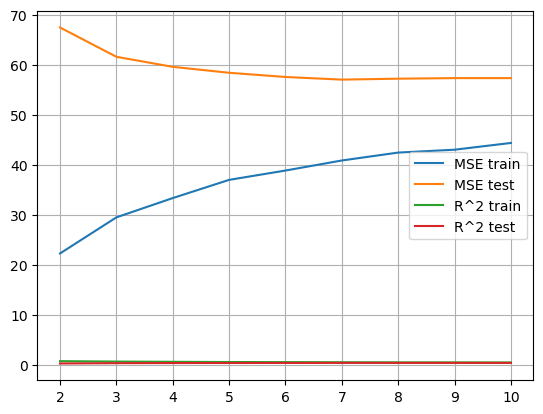

In [93]:
#We are giving the graph multiple k values that it can create the chart based off of.
kvals = [2,3,4,5,6,7,8,9,10] 
plt.plot(kvals, MSEs_train, label = 'MSE train')
plt.plot(kvals, MSEs_test,label = 'MSE test')
plt.plot(kvals, Rsqrd_train,label = 'R^2 train')
plt.plot(kvals, Rsqrd_test,label = 'R^2 test')
plt.grid() 
plt.legend()
plt.show()

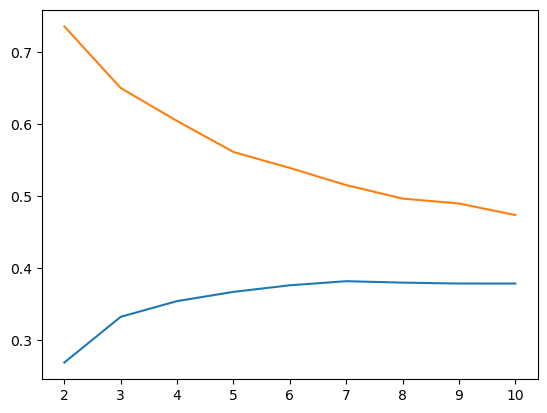

In [158]:
#7 is the best R^2 because after 7 you are overfitting 
plt.plot(kvals, Rsqrd_test,label = 'R^2 test')
plt.plot(kvals, Rsqrd_train,label = 'R^2 train')

Based on these results, it was a decided that linear regression was the best model because we were using numeric values in the data. We started this analysis of the data with removing the NaN values to clean up the data. This is allowing for better model accuracy and sways away from false regression trends. The MSE score remains consistent at a value of 57 , in which it does not rise after 6 or 7 neighbors have been put in. This is because the predictions barely change due to the model averaging over many similar neighbors. The model predicts around life expectancy of around 8 years which indicates the features that were selected only capture around part of the variation. The R2 score of .38 confirms this as the model is only explaining about 1/3 of the variation. 